In [1]:
import os
import pickle
import sys

import geojson
import numpy as np
from superintendent import ClassLabeller

sys.path.append('../')
from scripts.data_tools import *

%load_ext autoreload
%autoreload 2

In [67]:
def load_preds(preds_file_name):
    with open('../outputs/' + preds_file_name, 'r') as f:
        data = geojson.load(f)
    preds = np.array([point['properties']['mean'] for point in data[:]])
    coords = np.array([np.mean(point['geometry']['coordinates'][0][:4], axis=(0)) for point in data[:]])
    return preds, coords

def filter_coords_by_threshold(preds, coords, thresh_floor, thresh_ceil, num_img):    
    threshold_index = np.logical_and(preds > thresh_floor, preds < thresh_ceil)
    threshold_coords = coords[threshold_index]
    print(len(threshold_coords), f"points detected between {thresh_floor} and {thresh_ceil}")
    
    if len(threshold_coords) > num_img:
        rand_index = np.random.choice(len(threshold_coords), num_img, replace=False)
        return threshold_coords[rand_index]
    else:
        return threshold_coords

def download_data(coords, rect_width=0.0025, scale=10, start_date='2019-03-01', num_months=2):
    print("Preparing to download", len(coords), "sample sites")
    history, img_stack = get_image_stack(coords, 
                                         start_date=start_date, 
                                         rect_width=rect_width, 
                                         scale=scale,
                                         num_months=num_months,
                                         cloud_mask=False)
    return history, img_stack

def label_data(rgb_img):
    labeler = ClassLabeller.from_images(
        features=rgb_img,
        canvas_size=(84, 84),
        options=['mine', 'uncertain', 'no mine']
    )
    return labeler

def filter_preds(labeler, img_stack):
    labels = np.array(labeler.new_labels)
    confirmed_positives = np.array(img_stack)[labels == 'mine']
    confirmed_negatives = np.array(img_stack)[labels == 'no mine']
    confirmed_images = np.concatenate((confirmed_positives, confirmed_negatives), axis=0)
    confirmed_labels = np.concatenate((np.ones(len(confirmed_positives)),
                                       np.zeros(len(confirmed_negatives))))
    
    assert len(confirmed_images) == len(confirmed_labels), "error, image/label mismatch!"

    return confirmed_images, confirmed_labels

# Filter Dataset

In [11]:
filename = 'bolivar_2020_v7_thresh_0.5'
preds, coords = load_preds(filename + '.geojson')

In [22]:
threshold_floor = 0.6
threshold_ceiling = 0.8
num_images = 225
target_coords = filter_coords_by_threshold(preds, coords, threshold_floor, threshold_ceiling, num_images)

1164 points detected between 0.6 and 0.8


In [23]:
history, img_stack = download_data(target_coords, num_months=2, start_date='2019-04-01')

Preparing to download 225 sample sites



Cloud Fraction 1.0
Cloud Fraction 0.9876847290640394
Cloud Fraction 0.06157635467980296
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.8805418719211823
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.4753694581280788
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.8347205707491082
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.14744351961950058
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.8522167487684729
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.1700356718192628
Cloud Fraction 0.0
Cloud Fraction 0.8644470868014269
Cloud Fraction 0.0023781212841854932
Cloud Fraction 0.8715814506539834
Cloud Fraction 0.0
Cloud Fraction 0.6694411414982164
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.8573127229488704
C

In [24]:
from tensorflow import keras
model = keras.models.load_model('../models/28_px_v7.h5')

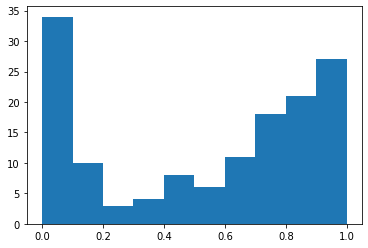

In [25]:
test_preds = model.predict(np.array(img_stack) / 3000)[:,1]
plt.hist(test_preds);

In [26]:
rgb_img = create_rgb(img_stack)

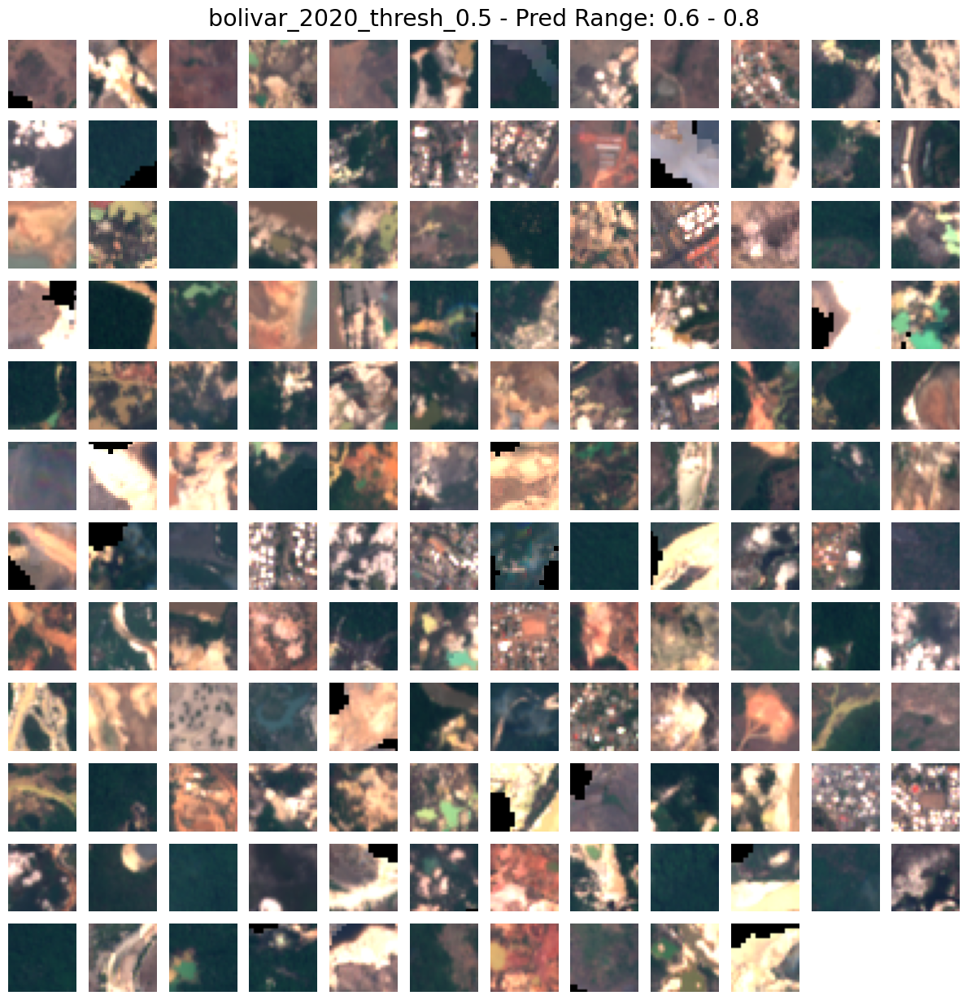

In [27]:
plot_image_grid(rgb_img, f'{filename} - Pred Range: {threshold_floor} - {threshold_ceiling}', save=False)

In [28]:
labeler = label_data(rgb_img)
labeler

ClassLabeller(children=(HBox(children=(FloatProgress(value=0.0, description='Progress:', max=1.0),)), Box(chil…

In [29]:
img, labels = filter_preds(labeler, img_stack)

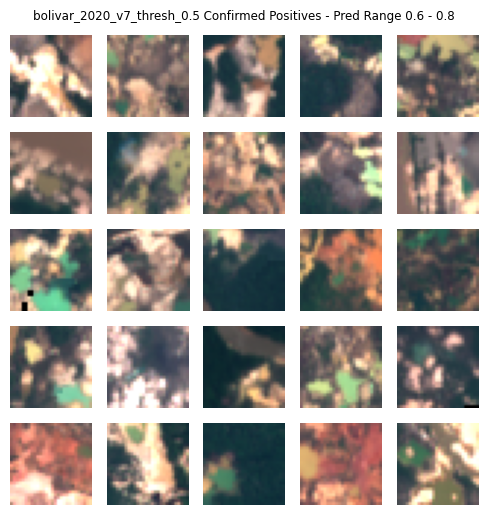

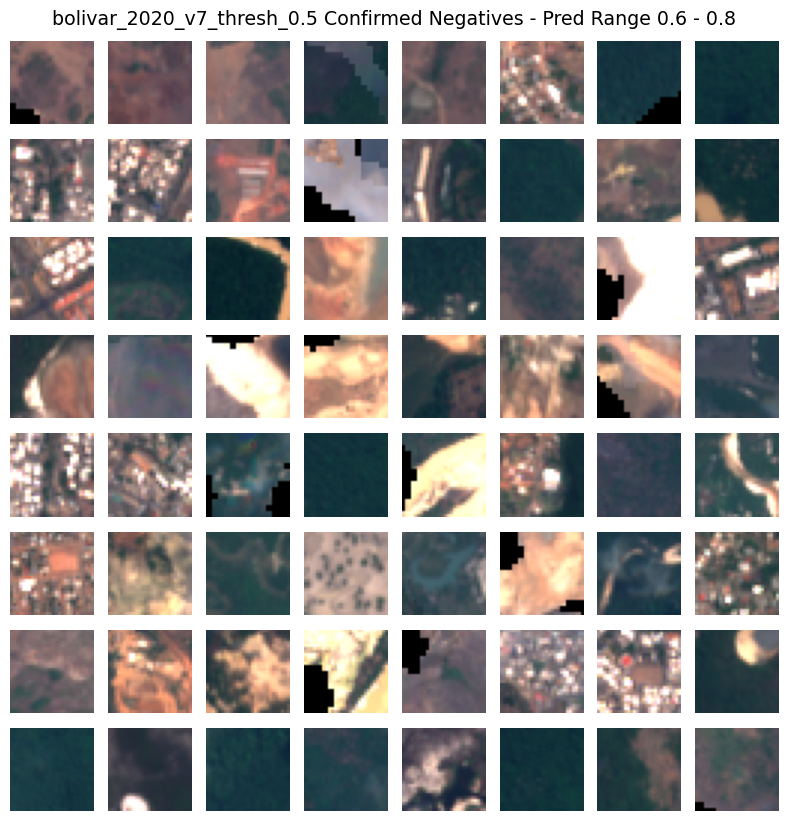

In [32]:
plot_image_grid(create_rgb(img[labels == 1]), f'{filename} Confirmed Positives - Pred Range {threshold_floor} - {threshold_ceiling}', save=True)
plot_image_grid(create_rgb(img[labels == 0]), f'{filename} Confirmed Negatives - Pred Range {threshold_floor} - {threshold_ceiling}', save=True)

In [33]:
with open(f'../data/caroni_train/{filename}_{threshold_floor}-{threshold_ceiling}_{len(img)}_images.pkl', 'wb') as f:
    pickle.dump(img, f)
    
with open(f'../data/caroni_train/{filename}_{threshold_floor}-{threshold_ceiling}_{len(labels)}_labels.pkl', 'wb') as f:
    pickle.dump(labels, f)

In [114]:
with open('../data/caroni_train/28_px_v1_caroni_0.95_thresh_images.pkl', 'wb') as f:
    pickle.dump(bootstrap_confirmed_images, f)
    
with open('../data/caroni_train/28_px_v1_caroni_0.95_thresh_labels.pkl', 'wb') as f:
    pickle.dump(bootstrap_confirmed_labels, f)

## Visualize Dataset

In [25]:
with open('../data/caroni_train/28_px_corrupted_images.pkl', 'rb') as f:
    corrupted = pickle.load(f)

In [26]:
corrupted_rgb = create_rgb(corrupted)

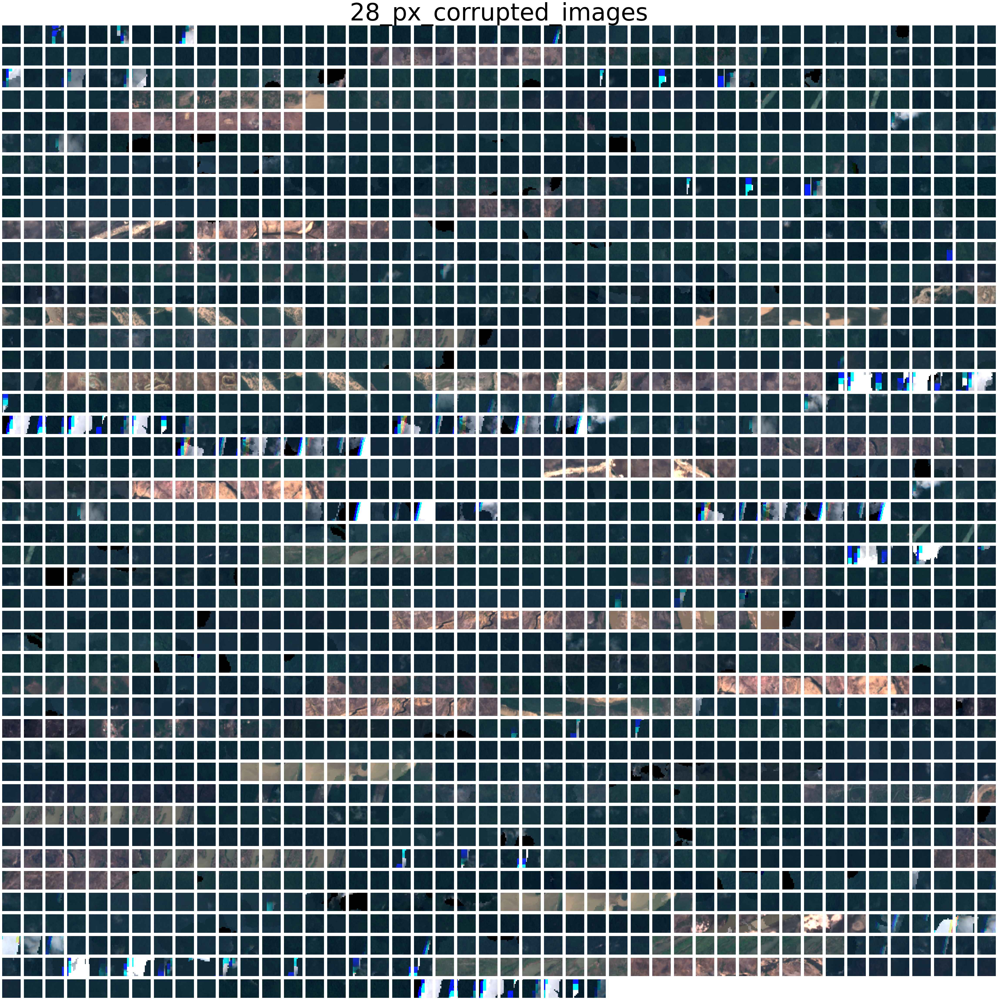

In [28]:
plot_image_grid(corrupted_rgb, f'28_px_corrupted_images', save=False)

## Confirmed Sites

In [69]:
filename = 'bolivar_2020_thresh_0.8negtraining'
with open('../data/confirmed_sites/' + filename + '.geojson', 'r') as f:
    data = geojson.load(f)
coords = [site['geometry']['coordinates'] for site in data['features']]
filename = 'amazonas_2020_thresh_0.5negtraining'
with open('../data/confirmed_sites/' + filename + '.geojson', 'r') as f:
    data = geojson.load(f)
    
coords += [site['geometry']['coordinates'] for site in data['features']]
coord_center = []
for coord in coords:
    mean_lon = np.mean([site_coord[0] for site_coord in coord[0][:4]])
    mean_lat = np.mean([site_coord[1] for site_coord in coord[0][:4]])
    coord_center.append([mean_lon, mean_lat])

In [52]:
np.mean([coord[0] for coord in coords[1][0][:4]])
np.mean([coord[1] for coord in coords[1][0][:4]])

4.581503

In [61]:
history, img_stack = download_data(coord_center, num_months=2, start_date='2020-05-01')

Preparing to download 449 sample sites



Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.014268727705112961
Cloud Fraction 0.07609988109393578
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0713436385255648
Cloud Fraction 0.6599286563614745
Cloud Fraction 0.1902497027348395
Cloud Fraction 0.0
Cloud Fraction 0.45566502463054187
Cloud Fraction 0.9809750297265161
Cloud Fraction 1.0
Cloud Fraction 0.746730083234245
Cloud Fraction 0.48989298454221164
Cloud Fraction 0.0
Cloud Fraction 0.31391200951248516
Cloud Fraction 0.03210463733650416
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.28299643281807374
Cloud Fraction 0.7056650246305419
Cloud Fraction 0.0
Cloud Fraction 0.22660098522167488
Cloud Fraction 0.0
Cloud Fraction 0.1902497027348395
Cloud Fraction 0.05826397146254459
Cloud Fraction 0.98522167487

Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.990487514863258
Cloud Fraction 1.0
Cloud Fraction 0.535077288941736
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.014268727705112961
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.8335315101070154
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.059453032104637336
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.9770408163265306
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.9571938168846611
Cloud Fraction 0.9869203329369798
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 1.0
Cloud Fraction 0.4102259215219976
Cloud Fraction 0.8228299643281808
Cloud Fraction 1.0
Cloud Fraction 0.1810344827586207
Cloud Fraction 0.0
Cloud Fraction 1.0
Cloud Fraction 0

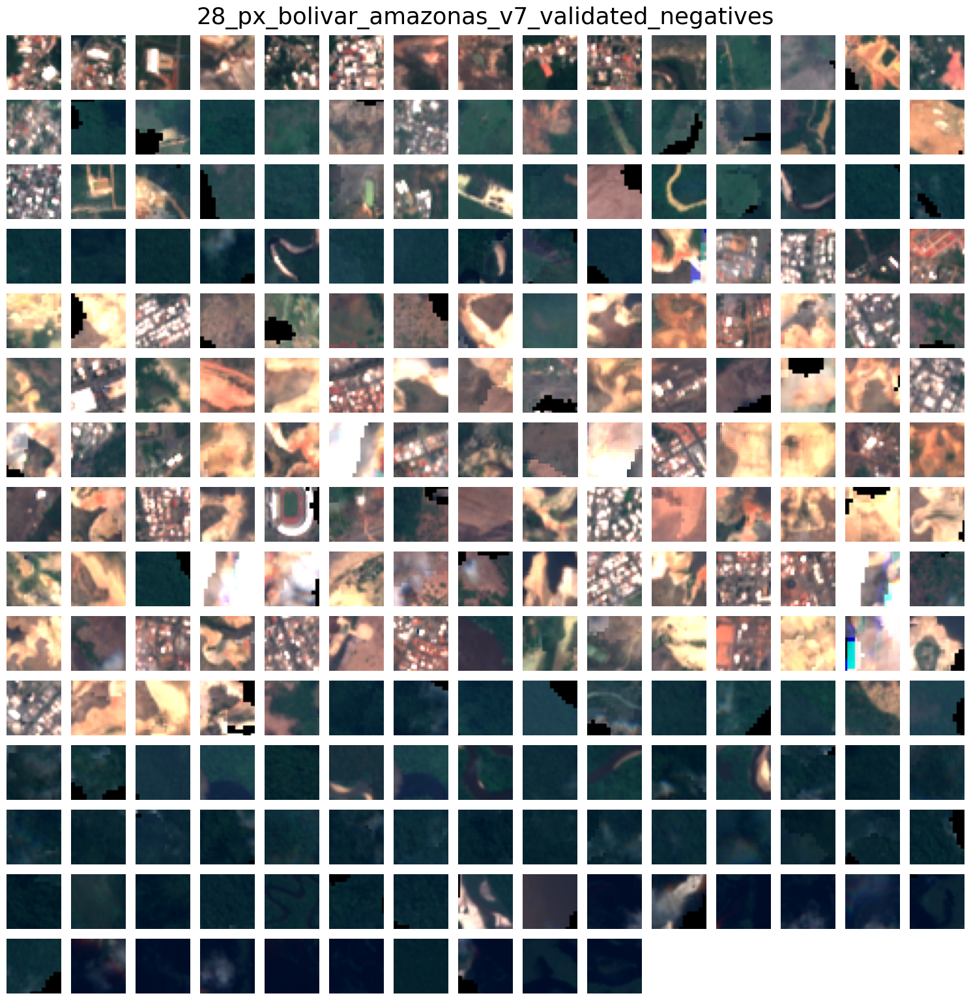

In [74]:
rgb_img = create_rgb(img_stack)
plot_image_grid(rgb_img, f'28_px_bolivar_amazonas_v7_validated_negatives', save=True)

In [75]:
with open(f'../data/caroni_train/28_px_bolivar_amazonas_v7_validated_negatives_{len(img_stack)}_images.pkl', 'wb') as f:
    pickle.dump(img_stack, f)
    
with open(f'../data/caroni_train/28_px_bolivar_amazonas_v7_validated_negatives_{len(img_stack)}_labels.pkl', 'wb') as f:
    pickle.dump(np.zeros(len(img_stack)), f)

In [70]:
history_cloudy, img_stack_cloudy = download_data(coord_center, num_months=2, start_date='2020-05-01')

Preparing to download 449 sample sites



Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fract

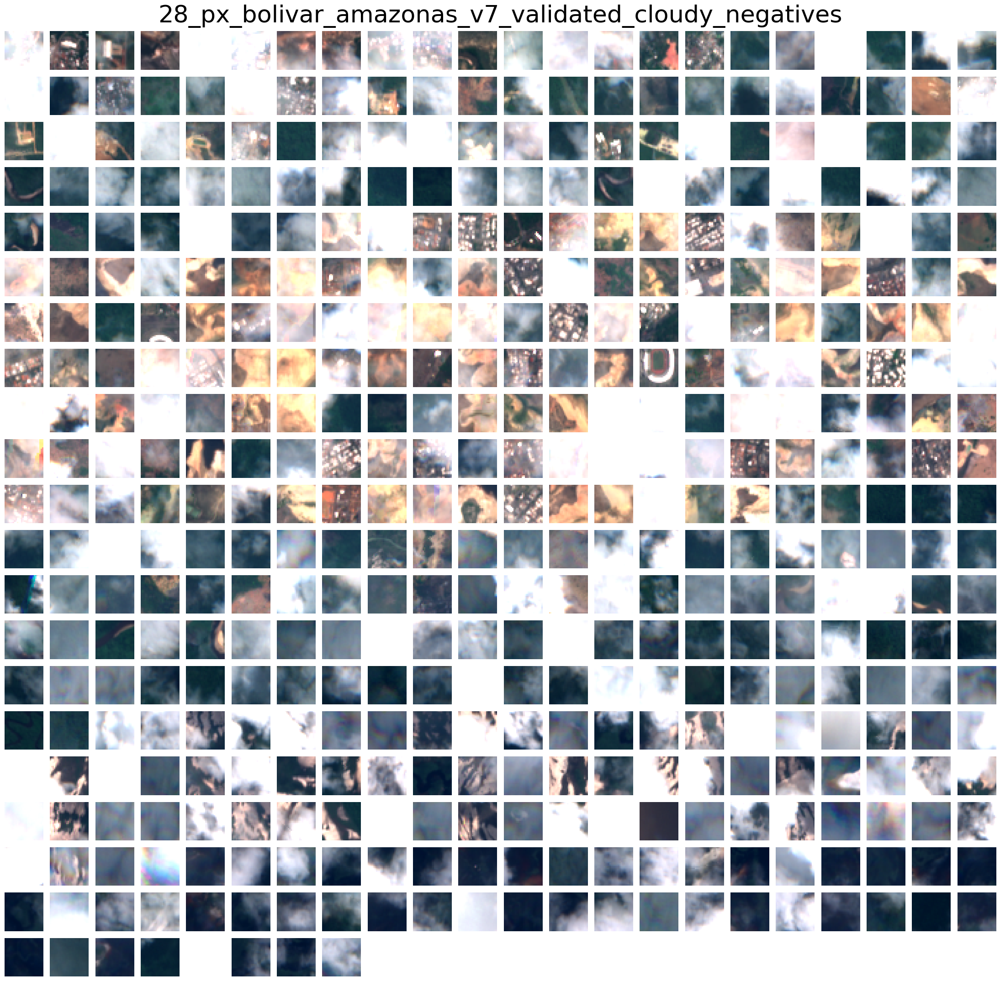

In [76]:
rgb_img_cloudy = create_rgb(img_stack_cloudy)
plot_image_grid(rgb_img_cloudy, f'28_px_bolivar_amazonas_v7_validated_cloudy_negatives', save=True)

In [79]:
with open(f'../data/caroni_train/28_px_bolivar_amazonas_v7_validated_cloudy_negatives_{len(img_stack_cloudy)}_images.pkl', 'wb') as f:
    pickle.dump(img_stack_cloudy, f)
    
with open(f'../data/caroni_train/28_px_bolivar_amazonas_v7_validated_cloudy_negatives_{len(img_stack_cloudy)}_labels.pkl', 'wb') as f:
    pickle.dump(np.zeros(len(img_stack_cloudy)), f)

In [68]:
filename = 'bolivar_2020_thresh_0.8postraining'
with open('../data/confirmed_sites/' + filename + '.geojson', 'r') as f:
    data = geojson.load(f)
coords = [site['geometry']['coordinates'] for site in data['features']]
filename = 'amazonas_2020_thresh_0.5postraining'
with open('../data/confirmed_sites/' + filename + '.geojson', 'r') as f:
    data = geojson.load(f)
    
coords += [site['geometry']['coordinates'] for site in data['features']]
coord_center_pos = []
for coord in coords:
    mean_lon = np.mean([site_coord[0] for site_coord in coord[0][:4]])
    mean_lat = np.mean([site_coord[1] for site_coord in coord[0][:4]])
    coord_center_pos.append([mean_lon, mean_lat])

In [64]:
history_pos, pos_img_stack = download_data(coord_center_pos, num_months=2, start_date='2020-05-01')

Preparing to download 1154 sample sites



Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.19500594530321047
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.09512485136741974
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.3923900118906064
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.4102259215219976
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.22473246135552913
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.2473246135552913
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.6456599286563615
Cloud Fraction 0.0
Cloud Fraction 0.

Cloud Fraction 0.0
Cloud Fraction 1.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.5374554102259215
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.9453032104637337
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.007134363852556481
Cloud Fraction 0.0
Cloud Fraction 0.11058263971462545
Cloud Fraction 0.0
Cloud Fraction 0.023781212841854936
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.23781212841854935
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.6650246305418719
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 

Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0049261083743842365
Cloud Fraction 0.0
Cloud Fraction 0.43876337693222356
Cloud Fraction 0.0
Cloud Fraction 0.16502463054187191
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.48513674197384066
Cloud Fraction 0.0
Cloud Fraction 0.039239001189060645
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.8727705112960761
Cloud Fraction 0.0047562425683709865
Cloud Fraction 0.4708680142687277
Cloud Fraction 0.0
Cloud Fraction 0.46921182266009853
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.9950738916256158
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.04518430439952437
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.7348394768133175
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.014268727705112961
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fract

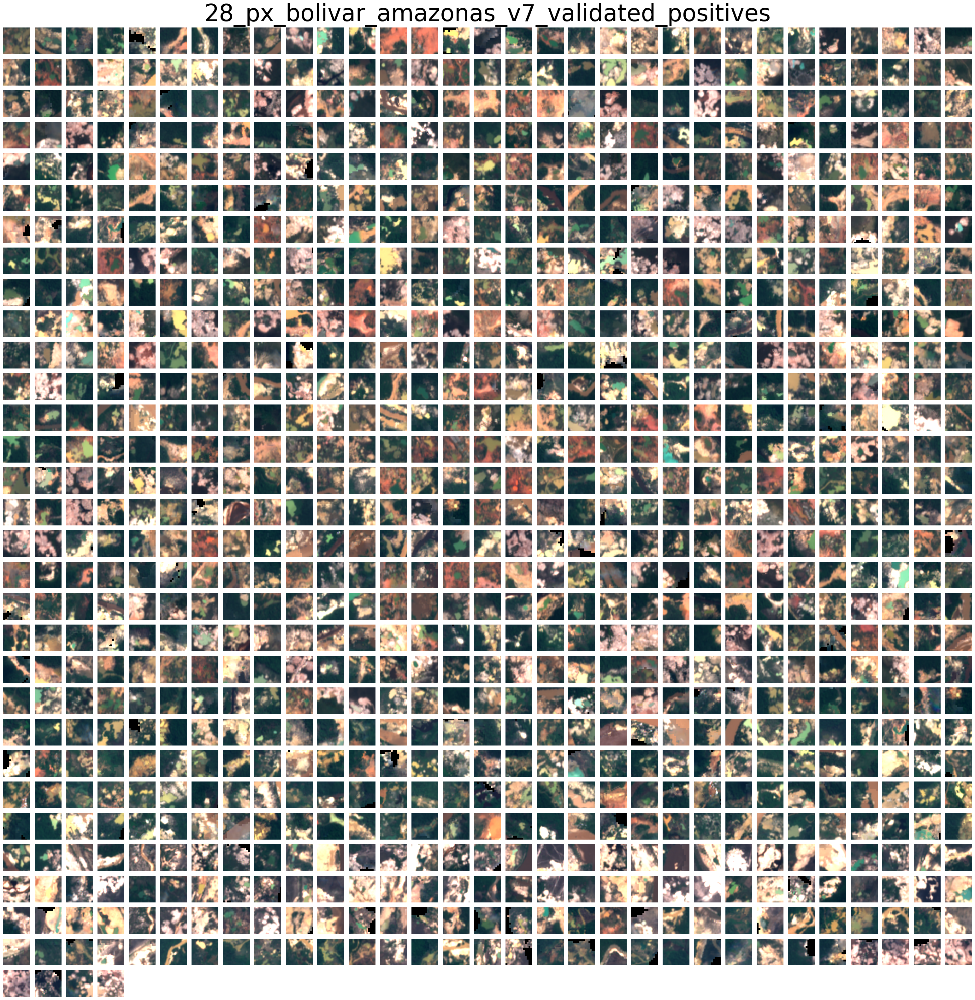

In [77]:
rgb_img_pos = create_rgb(pos_img_stack)
plot_image_grid(rgb_img_pos, f'28_px_bolivar_amazonas_v7_validated_positives', save=True)

In [78]:
with open(f'../data/caroni_train/28_px_bolivar_amazonas_v7_validated_positives_{len(pos_img_stack)}_images.pkl', 'wb') as f:
    pickle.dump(pos_img_stack, f)
    
with open(f'../data/caroni_train/28_px_bolivar_amazonas_v7_validated_positives_{len(pos_img_stack)}_labels.pkl', 'wb') as f:
    pickle.dump(np.ones(len(pos_img_stack)), f)